<a href="https://colab.research.google.com/github/AbdulazeezAde/Computer_vision_problems/blob/main/DCGAN_WITH_CHOWNET.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# DCGAN WITH CHOWNET DATA

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import os
from google.colab import drive

In [ ]:
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
class FoodDataset(Dataset):
    def __init__(self, folder_path, transform=None):
        self.folder_path = folder_path
        self.transform = transform
        self.image_files = []

        # Validate and filter images
        for f in os.listdir(folder_path):
            if f.endswith(('.jpg', '.jpeg', '.png')):
                try:
                    img_path = os.path.join(folder_path, f)
                    with Image.open(img_path) as img:
                        img.verify()
                    self.image_files.append(f)
                except:
                    print(f"Skipping invalid image: {f}")

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        try:
            img_path = os.path.join(self.folder_path, self.image_files[idx])
            image = Image.open(img_path).convert('RGB')
            if self.transform:
                image = self.transform(image)
            return image
        except Exception as e:
            print(f"Error loading image {self.image_files[idx]}: {str(e)}")
            return torch.zeros((3, 64, 64))

In [ ]:
class Generator(nn.Module):
    def __init__(self, latent_dim, feature_maps_g=64):
        super(Generator, self).__init__()

        self.main = nn.Sequential(
            # Input is latent_dim x 1 x 1
            nn.ConvTranspose2d(latent_dim, feature_maps_g * 8, 4, 1, 0, bias=False),# (in_channels, out_channels, kernel_size, stride=1, padding=0)
            nn.BatchNorm2d(feature_maps_g * 8),
            nn.LeakyReLU(True),
            # State size: (feature_maps_g*8) x 4 x 4

            nn.ConvTranspose2d(feature_maps_g * 8, feature_maps_g * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_maps_g * 4),
            nn.LeakyReLU(True),
            # State size: (feature_maps_g*4) x 8 x 8

            nn.ConvTranspose2d(feature_maps_g * 4, feature_maps_g * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_maps_g * 2),
            nn.LeakyReLU(True),
            # State size: (feature_maps_g*2) x 16 x 16

            nn.ConvTranspose2d(feature_maps_g * 2, feature_maps_g, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_maps_g),
            nn.LeakyReLU(True),
            # State size: feature_maps_g x 32 x 32

            nn.ConvTranspose2d(feature_maps_g, 3, 4, 2, 1, bias=False),
            nn.Tanh()
            # Final state size: 3 x 64 x 64
        )

    def forward(self, x):
        return self.main(x)

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, feature_maps_d=64):
        super(Discriminator, self).__init__()

        self.main = nn.Sequential(
            # Input is 3 x 64 x 64
            nn.Conv2d(3, feature_maps_d, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout2d(0.3),
            # State size: feature_maps_d x 32 x 32

            nn.Conv2d(feature_maps_d, feature_maps_d * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_maps_d * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout2d(0.3),
            # State size: (feature_maps_d*2) x 16 x 16

            nn.Conv2d(feature_maps_d * 2, feature_maps_d * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_maps_d * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout2d(0.3),
            # State size: (feature_maps_d*4) x 8 x 8

            nn.Conv2d(feature_maps_d * 4, feature_maps_d * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_maps_d * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout2d(0.3),
            # State size: (feature_maps_d*8) x 4 x 4

            nn.Conv2d(feature_maps_d * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
            # Final state size: 1 x 1 x 1
        )

    def forward(self, x):
        return self.main(x).view(-1, 1).squeeze(1)

In [ ]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [ ]:
def train_dcgan():
    # Hyperparameters
    latent_dim = 20
    batch_size = 8
    num_epochs = 100
    lr_d = 0.0001
    lr_g = 0.0002  # Slightly higher learning rate for generator
    beta1 = 0.5
    label_smoothing = 0.1  # Amount of label smoothing
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Enable CUDA error checking
    if torch.cuda.is_available():
        torch.cuda.set_device(0)
        print(f"Using GPU: {torch.cuda.get_device_name(0)}")

    # Data loading
    transform = transforms.Compose([
    transforms.Resize(64),
    transforms.CenterCrop(64),
    transforms.RandomHorizontalFlip(p=0.5),  # Random horizontal flips
    transforms.RandomRotation(10),           # Slight rotations
    transforms.ColorJitter(                  # Color variations
        brightness=0.2,
        contrast=0.2,
        saturation=0.2,
        hue=0.1
    ),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

    try:
        dataset = FoodDataset('/content/drive/MyDrive/chownet_images/chownet_images', transform=transform)
        dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers = 2,drop_last=True,
            pin_memory=True  # Faster data transfer to GPU
        )
        print(f"Dataset size: {len(dataset)} images")
        print(f"Number of batches per epoch: {len(dataloader)}")
    except Exception as e:
        print(f"Error loading dataset: {str(e)}")
        return

    # Initialize models
    netG = Generator(latent_dim).to(device)
    netD = Discriminator().to(device)

    # Initialize weights
    netG.apply(weights_init)
    netD.apply(weights_init)

    # Setup optimizers
    optimizerD = optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))
    optimizerG = optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))

    # Learning rate schedulers
    schedulerD = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizerD, mode='min', factor=0.5, patience=10)
    schedulerG = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizerG, mode='min', factor=0.5, patience=10)


    criterion = nn.BCELoss()

    # Fixed noise for visualization
    fixed_noise = torch.randn(64, latent_dim, 1, 1, device=device)

    # Lists to store losses for plotting
    G_losses = []
    D_losses = []

    print("Starting training...")

    try:
        for epoch in range(num_epochs):
            for i, data in enumerate(dataloader):
                ############################
                # Update Discriminator
                ############################
                netD.zero_grad()
                real_cpu = data.to(device)
                batch_size = real_cpu.size(0)
                label_real = torch.ones(batch_size, device=device)
                label_fake = torch.zeros(batch_size, device=device)



                # Train with real
                output = netD(real_cpu)
                errD_real = criterion(output, label_real)
                D_x = output.mean().item()

                # Train with fake
                noise = torch.randn(batch_size, latent_dim, 1, 1, device=device)
                fake = netG(noise)
                output = netD(fake.detach())
                errD_fake = criterion(output, label_fake)
                D_G_z1 = output.mean().item()

                errD = errD_real + errD_fake
                errD.backward()
                optimizerD.step()

                ############################
                # Update Generator
                ############################
                  # Train the generator twice for each discriminator update
                netG.zero_grad()
                output = netD(fake)
                errG = criterion(output, label_real)
                errG.backward()
                D_G_z2 = output.mean().item()
                optimizerG.step()

                schedulerD.step(errD)
                schedulerG.step(errG)

                # Save losses for plotting
                G_losses.append(errG.item())
                D_losses.append(errD.item())

                if i % 100 == 0:
                    print(f'[{epoch}/{num_epochs}][{i}/{len(dataloader)}] '
                          f'Loss_D: {errD.item():.4f} Loss_G: {errG.item():.4f} '
                          f'D(x): {D_x:.4f} D(G(z)): {D_G_z1:.4f}/{D_G_z2:.4f}')

            # Check how the generator is doing by saving G's output on fixed_noise
            if (epoch + 1) % 10 == 0:
                with torch.no_grad():
                    fake = netG(fixed_noise).detach().cpu()
                    plt.figure(figsize=(8,8))
                    plt.axis("off")
                    plt.title(f"Fake Images - Epoch {epoch+1}")
                    plt.imshow(np.transpose(make_grid(fake, padding=2, normalize=True), (1,2,0)))
                    plt.show()

                # Save model checkpoints
                torch.save({
                    'epoch': epoch,
                    'generator_state_dict': netG.state_dict(),
                    'discriminator_state_dict': netD.state_dict(),
                    'optimizerG_state_dict': optimizerG.state_dict(),
                    'optimizerD_state_dict': optimizerD.state_dict(),
                    'G_losses': G_losses,
                    'D_losses': D_losses,
                }, f'dcgan_checkpoint_epoch_{epoch+1}.pt')

    except RuntimeError as e:
        print(f"CUDA error during training: {str(e)}")
        # Try to save model before exiting
        torch.save({
            'generator_state_dict': netG.state_dict(),
            'discriminator_state_dict': netD.state_dict(),
            'optimizerG_state_dict': optimizerG.state_dict(),
            'optimizerD_state_dict': optimizerD.state_dict(),
        }, 'dcgan_checkpoint_error.pt')

    # Plot training losses
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss During Training")
    plt.plot(G_losses, label="G")
    plt.plot(D_losses, label="D")
    plt.xlabel("Iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

Dataset size: 118 images
Number of batches per epoch: 14
Starting training...
[0/100][0/14] Loss_D: 2.1920 Loss_G: 0.8968 D(x): 0.5941 D(G(z)): 0.6256/0.4804
[1/100][0/14] Loss_D: 1.6290 Loss_G: 1.3154 D(x): 0.7090 D(G(z)): 0.5958/0.3363
[2/100][0/14] Loss_D: 0.5565 Loss_G: 1.0508 D(x): 0.8570 D(G(z)): 0.2870/0.4319
[3/100][0/14] Loss_D: 0.6964 Loss_G: 1.7501 D(x): 0.8284 D(G(z)): 0.2757/0.3138
[4/100][0/14] Loss_D: 0.3001 Loss_G: 2.5421 D(x): 0.8398 D(G(z)): 0.0827/0.1540
[5/100][0/14] Loss_D: 0.8637 Loss_G: 2.1874 D(x): 0.7789 D(G(z)): 0.2540/0.1708
[6/100][0/14] Loss_D: 0.1457 Loss_G: 2.9042 D(x): 0.9484 D(G(z)): 0.0775/0.1023
[7/100][0/14] Loss_D: 0.8433 Loss_G: 2.1963 D(x): 0.7695 D(G(z)): 0.3237/0.1520
[8/100][0/14] Loss_D: 0.2390 Loss_G: 2.5134 D(x): 0.9729 D(G(z)): 0.1759/0.0915
[9/100][0/14] Loss_D: 0.0578 Loss_G: 3.2971 D(x): 0.9798 D(G(z)): 0.0362/0.0930


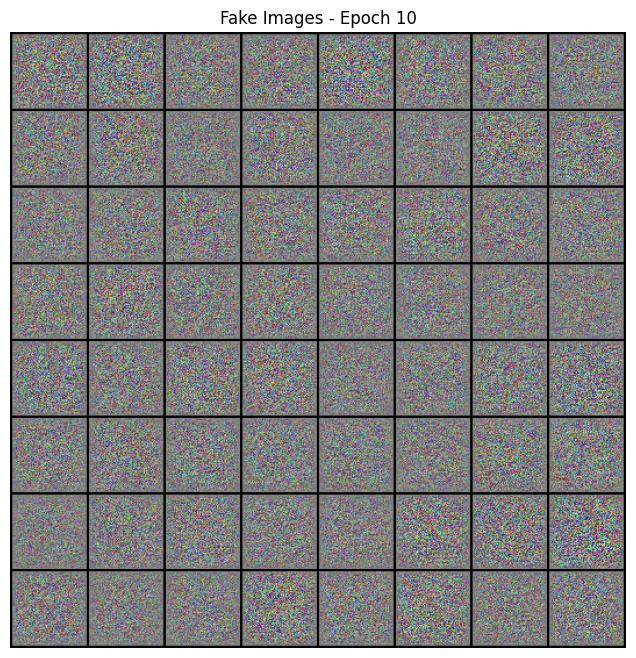

[10/100][0/14] Loss_D: 0.1097 Loss_G: 2.6198 D(x): 0.9322 D(G(z)): 0.0204/0.1247
[11/100][0/14] Loss_D: 0.1973 Loss_G: 2.7043 D(x): 0.9049 D(G(z)): 0.0480/0.1151
[12/100][0/14] Loss_D: 0.5888 Loss_G: 3.2050 D(x): 0.7825 D(G(z)): 0.0860/0.0519
[13/100][0/14] Loss_D: 0.1654 Loss_G: 2.8721 D(x): 0.9429 D(G(z)): 0.0823/0.0898
[14/100][0/14] Loss_D: 0.1727 Loss_G: 2.9367 D(x): 0.9630 D(G(z)): 0.1192/0.1680
[15/100][0/14] Loss_D: 0.1337 Loss_G: 3.7079 D(x): 0.9236 D(G(z)): 0.0426/0.0576
[16/100][0/14] Loss_D: 0.1681 Loss_G: 3.0803 D(x): 0.9130 D(G(z)): 0.0612/0.0656
[17/100][0/14] Loss_D: 0.1415 Loss_G: 3.8167 D(x): 0.9078 D(G(z)): 0.0295/0.0674
[18/100][0/14] Loss_D: 0.0798 Loss_G: 4.0994 D(x): 0.9861 D(G(z)): 0.0605/0.0396
[19/100][0/14] Loss_D: 0.1598 Loss_G: 3.5250 D(x): 0.9466 D(G(z)): 0.0939/0.0732


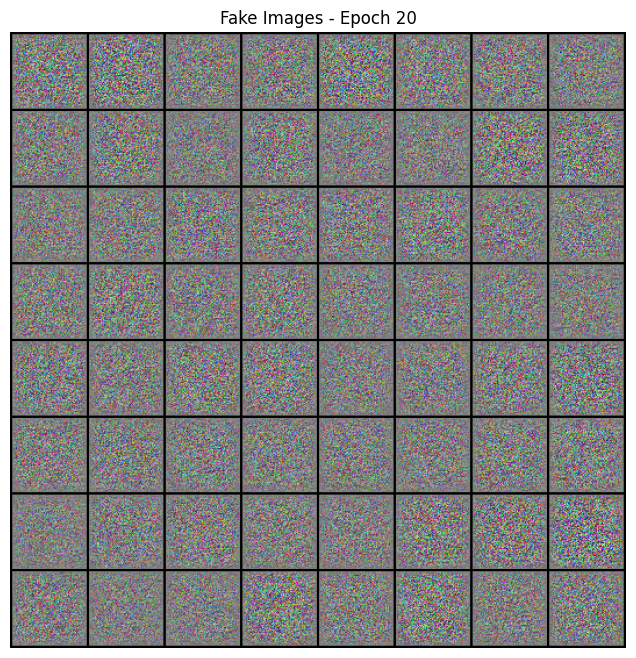

[20/100][0/14] Loss_D: 0.2096 Loss_G: 2.4401 D(x): 0.9056 D(G(z)): 0.0941/0.1947
[21/100][0/14] Loss_D: 0.1594 Loss_G: 3.2684 D(x): 0.9106 D(G(z)): 0.0483/0.0653
[22/100][0/14] Loss_D: 0.0502 Loss_G: 4.0406 D(x): 0.9852 D(G(z)): 0.0339/0.0315
[23/100][0/14] Loss_D: 0.1266 Loss_G: 4.0261 D(x): 0.9548 D(G(z)): 0.0716/0.0290
[24/100][0/14] Loss_D: 0.1821 Loss_G: 2.6070 D(x): 0.8909 D(G(z)): 0.0472/0.1287
[25/100][0/14] Loss_D: 0.2868 Loss_G: 2.9690 D(x): 0.8713 D(G(z)): 0.0976/0.0985
[26/100][0/14] Loss_D: 0.3735 Loss_G: 3.6762 D(x): 0.8805 D(G(z)): 0.1156/0.0549
[27/100][0/14] Loss_D: 0.0888 Loss_G: 4.4763 D(x): 0.9474 D(G(z)): 0.0293/0.0285
[28/100][0/14] Loss_D: 0.2482 Loss_G: 3.5769 D(x): 0.9720 D(G(z)): 0.1271/0.0605
[29/100][0/14] Loss_D: 0.1095 Loss_G: 3.4248 D(x): 0.9806 D(G(z)): 0.0790/0.0763


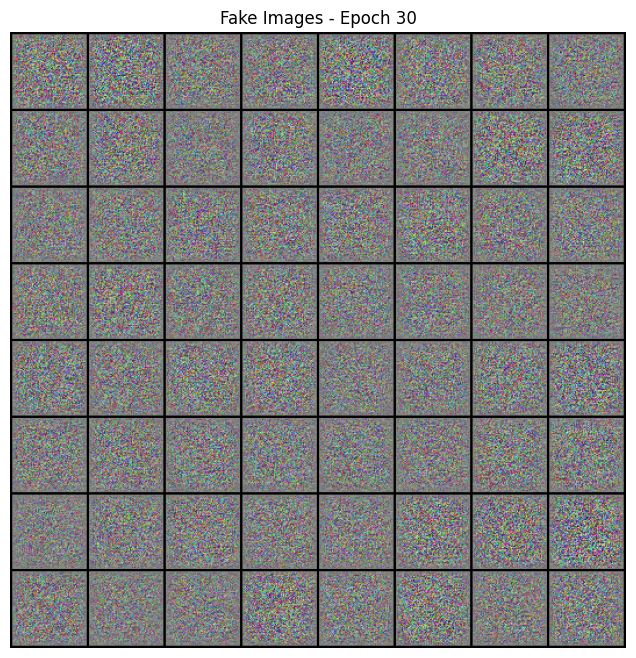

[30/100][0/14] Loss_D: 0.1546 Loss_G: 3.4437 D(x): 0.9306 D(G(z)): 0.0705/0.0441
[31/100][0/14] Loss_D: 0.1232 Loss_G: 4.0930 D(x): 0.9363 D(G(z)): 0.0420/0.0575
[32/100][0/14] Loss_D: 0.4470 Loss_G: 3.3835 D(x): 0.7824 D(G(z)): 0.0598/0.0822
[33/100][0/14] Loss_D: 0.1362 Loss_G: 2.6942 D(x): 0.9367 D(G(z)): 0.0592/0.1063
[34/100][0/14] Loss_D: 0.1491 Loss_G: 3.3310 D(x): 0.9463 D(G(z)): 0.0789/0.0669
[35/100][0/14] Loss_D: 0.2799 Loss_G: 3.4592 D(x): 0.8778 D(G(z)): 0.1091/0.0993
[36/100][0/14] Loss_D: 0.3672 Loss_G: 2.7458 D(x): 0.7886 D(G(z)): 0.0920/0.1197
[37/100][0/14] Loss_D: 0.0747 Loss_G: 3.6535 D(x): 0.9738 D(G(z)): 0.0437/0.0755
[38/100][0/14] Loss_D: 0.8425 Loss_G: 3.8486 D(x): 0.8175 D(G(z)): 0.1225/0.0301
[39/100][0/14] Loss_D: 0.3359 Loss_G: 2.3038 D(x): 0.8906 D(G(z)): 0.1584/0.1819


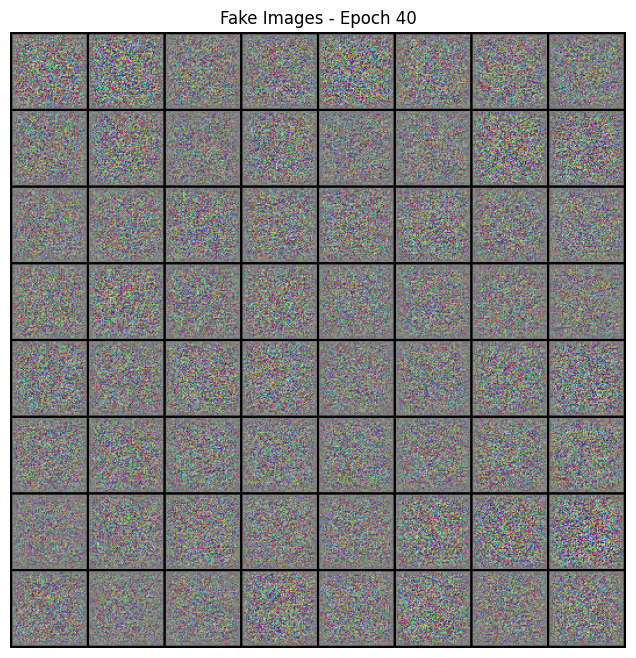

[40/100][0/14] Loss_D: 0.0651 Loss_G: 2.9241 D(x): 0.9785 D(G(z)): 0.0411/0.0637
[41/100][0/14] Loss_D: 0.0744 Loss_G: 2.6884 D(x): 0.9856 D(G(z)): 0.0565/0.0842
[42/100][0/14] Loss_D: 0.6679 Loss_G: 3.2557 D(x): 0.8257 D(G(z)): 0.1554/0.0680
[43/100][0/14] Loss_D: 0.4020 Loss_G: 2.5222 D(x): 0.8218 D(G(z)): 0.1174/0.0993
[44/100][0/14] Loss_D: 0.2765 Loss_G: 3.3905 D(x): 0.9147 D(G(z)): 0.1304/0.1608
[45/100][0/14] Loss_D: 0.2102 Loss_G: 2.8106 D(x): 0.8972 D(G(z)): 0.0781/0.1273
[46/100][0/14] Loss_D: 0.0512 Loss_G: 3.5078 D(x): 0.9979 D(G(z)): 0.0474/0.0545
[47/100][0/14] Loss_D: 0.3463 Loss_G: 4.1595 D(x): 0.9213 D(G(z)): 0.1749/0.0434
[48/100][0/14] Loss_D: 0.1160 Loss_G: 2.9312 D(x): 0.9858 D(G(z)): 0.0938/0.1016
[49/100][0/14] Loss_D: 0.4597 Loss_G: 2.7746 D(x): 0.8809 D(G(z)): 0.1450/0.0904


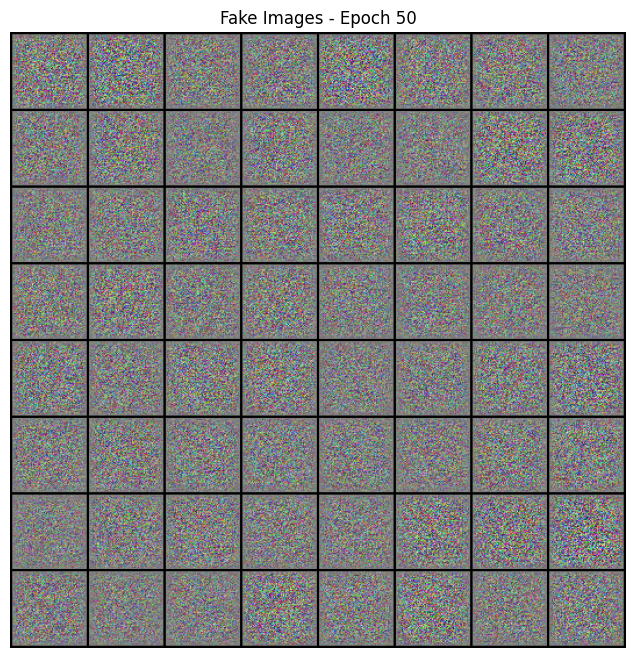

[50/100][0/14] Loss_D: 0.2182 Loss_G: 3.2992 D(x): 0.9321 D(G(z)): 0.1142/0.0478
[51/100][0/14] Loss_D: 0.2708 Loss_G: 2.9682 D(x): 0.8789 D(G(z)): 0.0916/0.1234
[52/100][0/14] Loss_D: 0.2706 Loss_G: 3.4021 D(x): 0.8806 D(G(z)): 0.0838/0.0626
[53/100][0/14] Loss_D: 0.1523 Loss_G: 3.4559 D(x): 0.9084 D(G(z)): 0.0473/0.0416
[54/100][0/14] Loss_D: 0.1745 Loss_G: 3.1074 D(x): 0.9447 D(G(z)): 0.0991/0.1114
[55/100][0/14] Loss_D: 0.2383 Loss_G: 2.5346 D(x): 0.9235 D(G(z)): 0.1249/0.1574
[56/100][0/14] Loss_D: 0.0991 Loss_G: 3.0762 D(x): 0.9761 D(G(z)): 0.0701/0.0795
[57/100][0/14] Loss_D: 0.3958 Loss_G: 3.2398 D(x): 0.8664 D(G(z)): 0.1518/0.0482
[58/100][0/14] Loss_D: 0.1784 Loss_G: 2.9147 D(x): 0.9122 D(G(z)): 0.0425/0.1042
[59/100][0/14] Loss_D: 0.1039 Loss_G: 3.4084 D(x): 0.9479 D(G(z)): 0.0455/0.0662


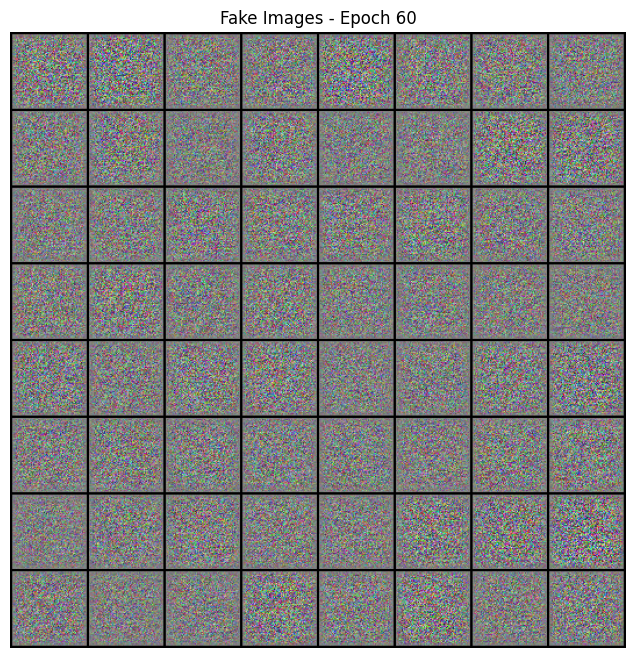

[60/100][0/14] Loss_D: 0.3947 Loss_G: 3.7146 D(x): 0.7920 D(G(z)): 0.0438/0.0753
[61/100][0/14] Loss_D: 0.0815 Loss_G: 3.2465 D(x): 0.9920 D(G(z)): 0.0663/0.0500
[62/100][0/14] Loss_D: 0.2235 Loss_G: 3.0726 D(x): 0.9028 D(G(z)): 0.0957/0.0807
[63/100][0/14] Loss_D: 0.1337 Loss_G: 3.6538 D(x): 0.9957 D(G(z)): 0.1123/0.0611
[64/100][0/14] Loss_D: 0.1987 Loss_G: 2.9689 D(x): 0.9097 D(G(z)): 0.0858/0.0738
[65/100][0/14] Loss_D: 0.1067 Loss_G: 3.8676 D(x): 0.9734 D(G(z)): 0.0755/0.0377
[66/100][0/14] Loss_D: 0.2948 Loss_G: 3.3918 D(x): 0.8785 D(G(z)): 0.0816/0.0444
[67/100][0/14] Loss_D: 0.3867 Loss_G: 3.2604 D(x): 0.7979 D(G(z)): 0.0877/0.0470
[68/100][0/14] Loss_D: 0.2506 Loss_G: 3.5339 D(x): 0.8955 D(G(z)): 0.1116/0.0696
[69/100][0/14] Loss_D: 0.4124 Loss_G: 3.4001 D(x): 0.7957 D(G(z)): 0.0723/0.0676


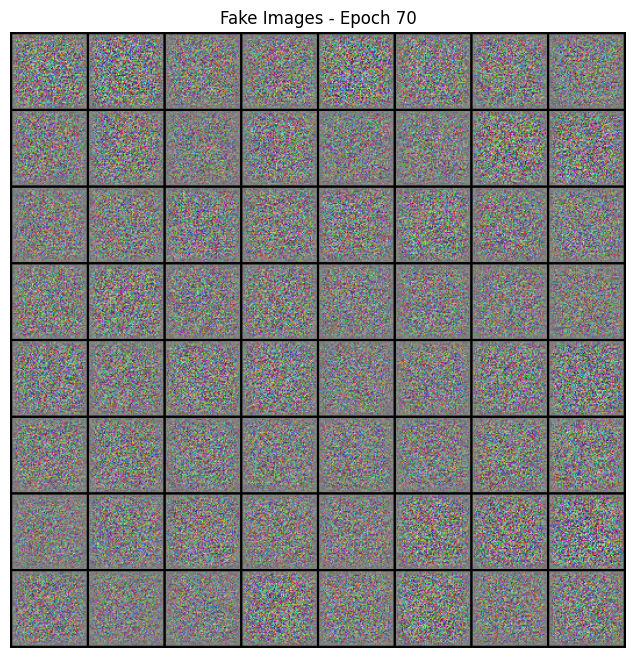

[70/100][0/14] Loss_D: 0.3324 Loss_G: 2.6802 D(x): 0.8906 D(G(z)): 0.1159/0.1725
[71/100][0/14] Loss_D: 0.3342 Loss_G: 2.6653 D(x): 0.8671 D(G(z)): 0.1499/0.1818
[72/100][0/14] Loss_D: 0.0585 Loss_G: 3.9303 D(x): 0.9743 D(G(z)): 0.0302/0.0332
[73/100][0/14] Loss_D: 0.1491 Loss_G: 4.4135 D(x): 0.9414 D(G(z)): 0.0764/0.0195
[74/100][0/14] Loss_D: 0.1812 Loss_G: 3.3104 D(x): 0.9504 D(G(z)): 0.1141/0.0923
[75/100][0/14] Loss_D: 0.3409 Loss_G: 3.5334 D(x): 0.8390 D(G(z)): 0.0655/0.0468
[76/100][0/14] Loss_D: 0.1755 Loss_G: 2.8388 D(x): 0.9604 D(G(z)): 0.1062/0.0877
[77/100][0/14] Loss_D: 0.5872 Loss_G: 3.4655 D(x): 0.7576 D(G(z)): 0.0726/0.0444
[78/100][0/14] Loss_D: 0.3386 Loss_G: 3.0722 D(x): 0.9239 D(G(z)): 0.1816/0.0997
[79/100][0/14] Loss_D: 0.1419 Loss_G: 2.8565 D(x): 0.9514 D(G(z)): 0.0805/0.0794


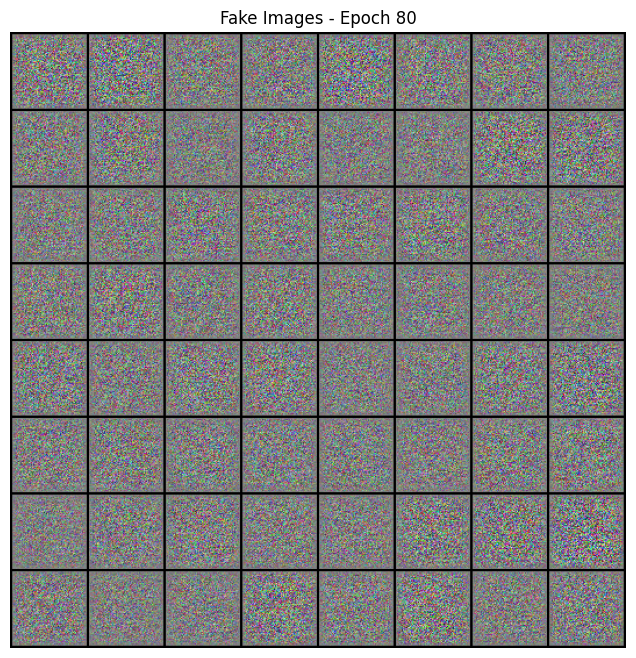

[80/100][0/14] Loss_D: 0.0815 Loss_G: 2.5550 D(x): 0.9751 D(G(z)): 0.0515/0.1508
[81/100][0/14] Loss_D: 0.4748 Loss_G: 3.2165 D(x): 0.8362 D(G(z)): 0.0431/0.0445
[82/100][0/14] Loss_D: 0.6771 Loss_G: 4.0366 D(x): 0.7879 D(G(z)): 0.0656/0.0295
[83/100][0/14] Loss_D: 0.1956 Loss_G: 3.6704 D(x): 0.8897 D(G(z)): 0.0674/0.0601
[84/100][0/14] Loss_D: 0.3049 Loss_G: 3.4516 D(x): 0.8826 D(G(z)): 0.0873/0.0643
[85/100][0/14] Loss_D: 0.7849 Loss_G: 2.0896 D(x): 0.7607 D(G(z)): 0.1965/0.1684
[86/100][0/14] Loss_D: 0.2404 Loss_G: 3.1808 D(x): 0.8694 D(G(z)): 0.0600/0.0549
[87/100][0/14] Loss_D: 0.3767 Loss_G: 2.3879 D(x): 0.8810 D(G(z)): 0.1444/0.1372
[88/100][0/14] Loss_D: 0.1528 Loss_G: 2.8622 D(x): 0.9246 D(G(z)): 0.0510/0.1220
[89/100][0/14] Loss_D: 0.1927 Loss_G: 3.5366 D(x): 0.9038 D(G(z)): 0.0201/0.0577


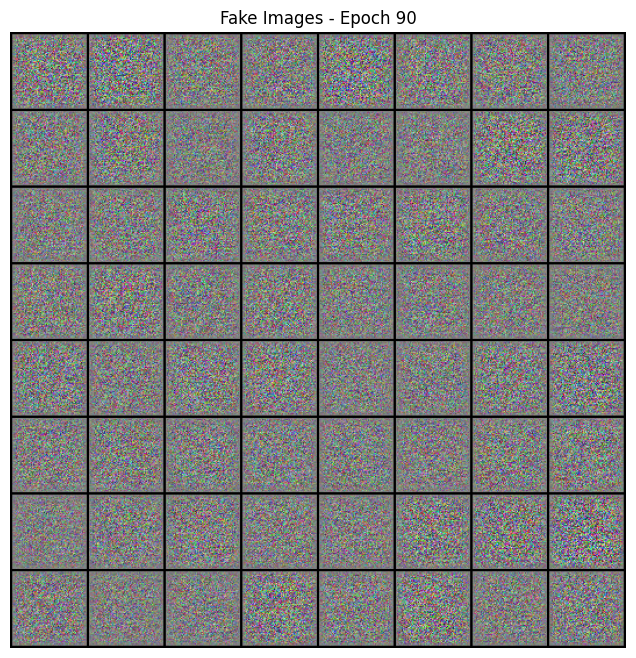

[90/100][0/14] Loss_D: 0.1305 Loss_G: 3.0225 D(x): 0.9360 D(G(z)): 0.0559/0.1717
[91/100][0/14] Loss_D: 0.1083 Loss_G: 3.6711 D(x): 0.9631 D(G(z)): 0.0621/0.0620
[92/100][0/14] Loss_D: 0.1762 Loss_G: 3.0473 D(x): 0.9049 D(G(z)): 0.0492/0.0877
[93/100][0/14] Loss_D: 0.1586 Loss_G: 2.7389 D(x): 0.9209 D(G(z)): 0.0575/0.1081
[94/100][0/14] Loss_D: 0.0681 Loss_G: 3.1148 D(x): 0.9837 D(G(z)): 0.0494/0.0988
[95/100][0/14] Loss_D: 0.0671 Loss_G: 2.9773 D(x): 0.9752 D(G(z)): 0.0395/0.0737
[96/100][0/14] Loss_D: 0.0726 Loss_G: 3.0449 D(x): 0.9698 D(G(z)): 0.0391/0.0726
[97/100][0/14] Loss_D: 0.3813 Loss_G: 3.0918 D(x): 0.9650 D(G(z)): 0.2518/0.1092
[98/100][0/14] Loss_D: 0.8097 Loss_G: 3.1340 D(x): 0.8205 D(G(z)): 0.0712/0.0668
[99/100][0/14] Loss_D: 0.2377 Loss_G: 3.8967 D(x): 0.8846 D(G(z)): 0.0878/0.0335


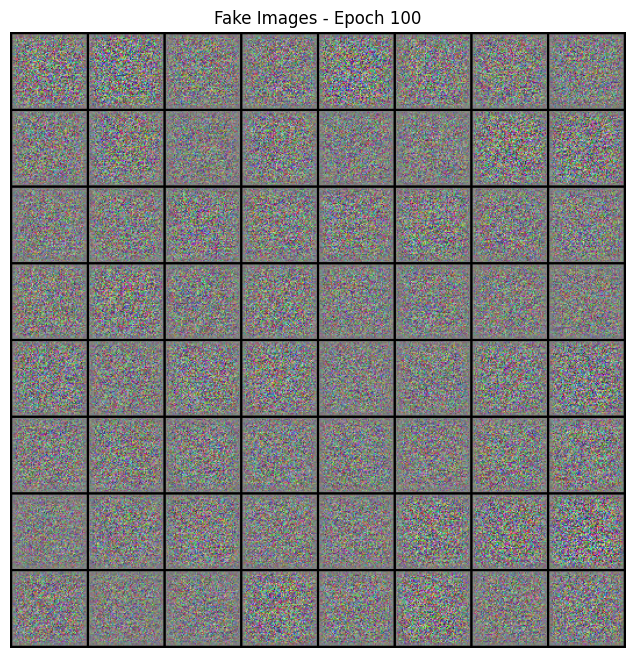

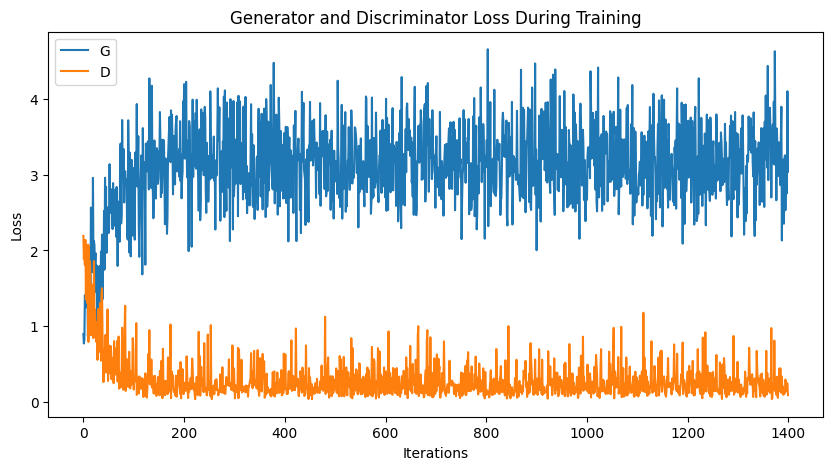

In [ ]:
if __name__ == "__main__":
    # Enable CUDA error checking
    os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
    train_dcgan()